In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from ekfplot import plot as ek

import make_punchlines
import make_alternates

logger = make_punchlines.setup_logging('INFO')

/Users/kadofong/opt/miniconda3/envs/merian/lib/python3.10/site-packages/umap/__init__.py:9: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn(


In [3]:
config = make_punchlines.load_config('../config.yaml')

In [5]:
#output_dir = make_punchlines.Path('./punchline_figures/')
# Load data
runtag = 'fiducial'
reruns = [runtag]
ix = 0
while os.path.exists(Path('../output') / f'{runtag}_rerun_{ix}/embeddings.npy' ):
    reruns.append( f'{runtag}_rerun_{ix}' ) 
    ix += 1
#data = load_data(config, logger)


In [7]:
data = make_punchlines.load_data_multirun(Path('../output/'),reruns,logger)

/Users/kadofong/work/projects/merian/pieridae/pieridae/starbursts/byol.py:1592: DeprecationWarning: invalid escape sequence '\*'
  """
2025-12-26 10:51:22,865 - make_punchlines - INFO - ============================================================
2025-12-26 10:51:22,866 - make_punchlines - INFO - LOADING DATA
2025-12-26 10:51:22,866 - make_punchlines - INFO - ============================================================
2025-12-26 10:51:22,867 - make_punchlines - INFO - Input path: ../../local_data/pieridae_output/starlet/msorabove_v1
2025-12-26 10:51:22,867 - make_punchlines - INFO - Output path: ../output/fiducial
2025-12-26 10:51:22,867 - make_punchlines - INFO - Loading image names...
2025-12-26 10:51:23,941 - make_punchlines - INFO - Found 22360 images
2025-12-26 10:51:23,941 - make_punchlines - INFO - Loading embeddings...
2025-12-26 10:51:23,942 - make_punchlines - INFO - Embeddings shape: (87, 512)
2025-12-26 10:51:23,943 - make_punchlines - INFO - Loading classification labels.

Computed aperture correction in 0.0 seconds.
Computed line contamination correction in 0.0 seconds.
Loading precomputed Galactic extinction map...
Interpolated Galactic extinction values from map.
Computed Galactic extinction correction in 0.7 seconds.
Computed internal extinction corrections in 0.8 seconds.


/Users/kadofong/work/projects/merian/agrias/python/agrias/photometry.py:115: RuntimeWarning: invalid value encountered in log10
  lsq_y = np.log10(np.array([ fdict[band] for band in plawbands ]))
/Users/kadofong/opt/miniconda3/envs/merian/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/kadofong/opt/miniconda3/envs/merian/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
2025-12-26 10:51:27,090 - make_punchlines - INFO - Loading cached masses...
2025-12-26 10:51:27,123 - make_punchlines - INFO - Using cached adjusted masses...


/Users/kadofong/.cache/merian/logmass_adjusted.csv


/Users/kadofong/work/projects/merian/pieridae/merger_analysis/figure_generation/make_punchlines.py:772: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  base_catalog.loc[logmstar_cache.index, 'logmass_adjusted'] = logmstar_cache['logmass_adjusted']


IndexError: boolean index did not match indexed array along dimension 0; dimension is 22360 but corresponding boolean dimension is 87

In [ ]:
output_dir = None

In [ ]:
make_punchlines.make_figure_label_distribution(data, None, logger)

In [ ]:
make_punchlines.make_figure_classification_conflicts(data, output_dir, logger)

In [50]:
from ekfstats import sampling

2025-12-22 19:26:57,744 - make_punchlines - INFO - Generating Figure 5: Merger fraction vs mass
2025-12-22 19:26:57,744 - make_punchlines - INFO - Generating Figure 5: Merger fraction vs mass
2025-12-22 19:26:57,744 - make_punchlines - INFO - Generating Figure 5: Merger fraction vs mass
/Users/kadofong/work/ekfutils/ekfstats/ekfstats/sampling.py:573: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  xpull = x[choice]
/Users/kadofong/work/ekfutils/ekfstats/ekfstats/sampling.py:590: RuntimeWarning: Mean of empty slice
  outcome = metric_fn ( ypull[mask] )
/Users/kadofong/opt/miniconda3/envs/merian/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/Users/kadofong/opt/miniconda3/envs/merian/lib/python3.10/site-packages/num

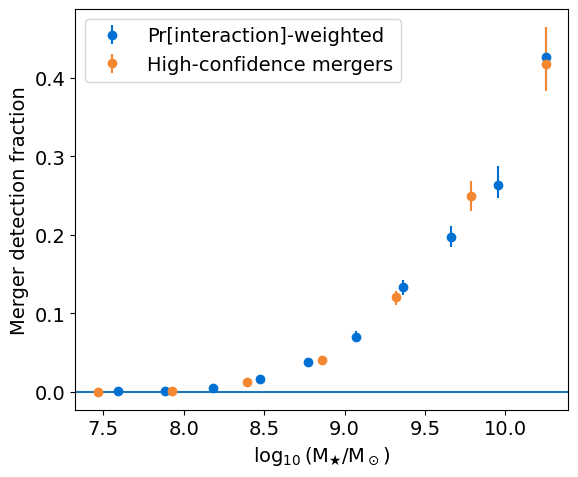

In [51]:
out = sampling.running_metric(
    data['catalog'].reindex(data['img_names'])['logmass_adjusted'],
    np.sqrt(data['std_prob_labels'][:,2]**2 + data['std_prob_labels'][:,3]**2),
    np.mean,
    np.linspace(8.,10.5,10),
)

samp = abs(np.random.normal(0., np.sqrt(data['std_prob_labels'][:,2]**2 + data['std_prob_labels'][:,3]**2),))

mask = data['catalog'].reindex(data['img_names'])['logmass_adjusted']<8.
floor = 0.# np.mean(data['mean_prob_labels'][mask,2])

make_punchlines.make_figure_merger_fraction_vs_mass(data, output_dir, logger)
plt.axhline(floor)

In [52]:
output_dir = make_punchlines.Path('/Users/kadofong/work/papers/journal/MerianStarbursts/figures/')


2025-12-22 19:27:02,183 - make_punchlines - INFO - Generating merger gallery for P[TF] > 0.9
2025-12-22 19:27:02,183 - make_punchlines - INFO - Generating merger gallery for P[TF] > 0.9
2025-12-22 19:27:02,183 - make_punchlines - INFO - Generating merger gallery for P[TF] > 0.9
2025-12-22 19:27:02,195 - make_punchlines - INFO - Found 528 galaxies with P[TF] > 0.9
2025-12-22 19:27:02,195 - make_punchlines - INFO - Found 528 galaxies with P[TF] > 0.9
2025-12-22 19:27:02,195 - make_punchlines - INFO - Found 528 galaxies with P[TF] > 0.9
2025-12-22 19:27:02,196 - make_punchlines - INFO - Displaying 20 galaxies in 5x4 grid
2025-12-22 19:27:02,196 - make_punchlines - INFO - Displaying 20 galaxies in 5x4 grid
2025-12-22 19:27:02,196 - make_punchlines - INFO - Displaying 20 galaxies in 5x4 grid


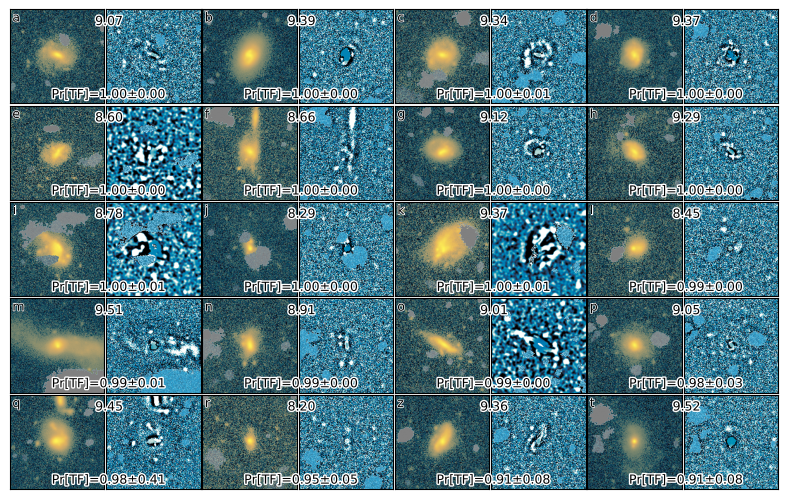

In [53]:
import numpy as np
np.random.seed(2) #6
ids = make_punchlines.make_figure_merger_gallery(
    data, None, logger, n_cols=4, n_rows=5, tf_thresh=0.9, logmstar_max=9.6, lupton_stretch=1.
)

In [43]:
print(' '.join(ids))

M3410315633454250781 M3582507950456976852 M3373389634946999592 M3036538854615060378 M3324989133092329236 M3329114500719749730 M3501557506373607968 M3036433301498795560 M2951414664392623048 M3327315699696712457 M3322209567697297076 M2951058422625234228 M3497075896978794142 M3493368343769918252 M3580678363108375415 M3037031435824293685 M3494239156979139159 M3320740620162588954 M3545392835949781877 M3418795067127647486


2025-12-22 19:30:00,202 - make_punchlines - INFO - Generating P[tf] chart
2025-12-22 19:30:00,202 - make_punchlines - INFO - Generating P[tf] chart
2025-12-22 19:30:00,202 - make_punchlines - INFO - Generating P[tf] chart


M3408486046105616708
M3417348109825489820
M3243528515613645221
M3418795067127647486
M3501909350094513058


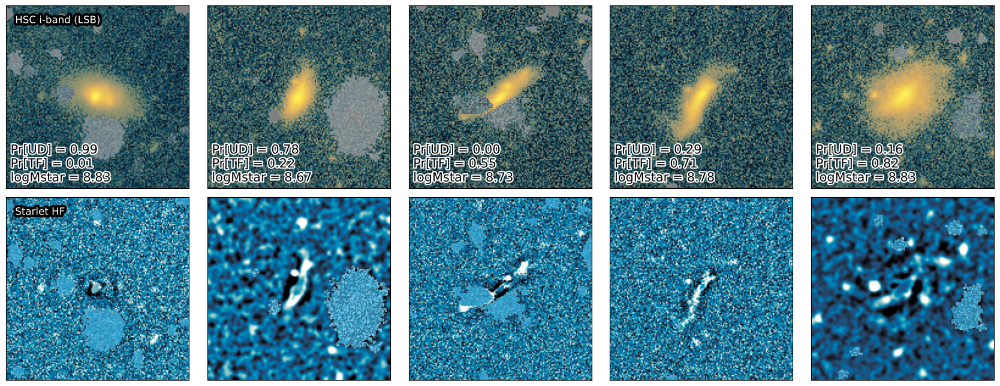

In [54]:

np.random.seed(1)#24
# 23
make_punchlines.make_figure_ptf_chart(data, None, logger, logmstar_max = 9.)

2025-12-22 19:30:17,782 - make_punchlines - INFO - Generating P[tf] chart
2025-12-22 19:30:17,782 - make_punchlines - INFO - Generating P[tf] chart
2025-12-22 19:30:17,782 - make_punchlines - INFO - Generating P[tf] chart


M3235383333475084541
M3410847797082082732
M3501997311024721846
M3234600481196100305
M3339537870951047532


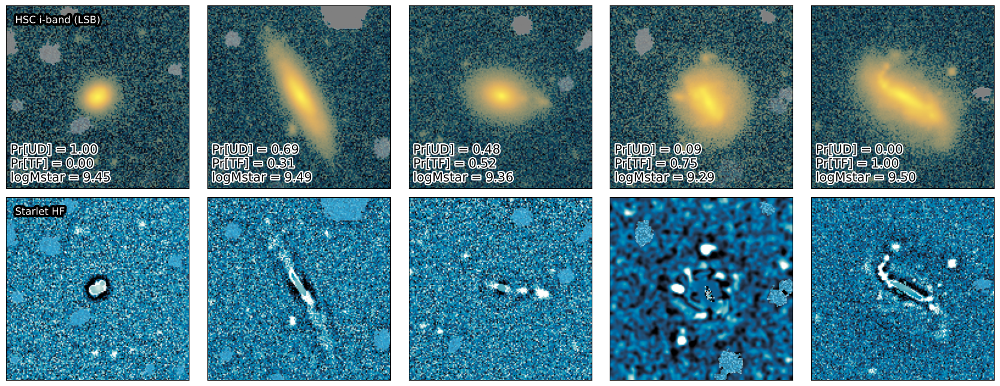

In [57]:
np.random.seed(2)#32
# 23
make_punchlines.make_figure_ptf_chart(data, None, logger, logmstar_max = 9.5, logmstar_min=9.2)

In [22]:
from ekfplot import colors as ec

2025-12-22 19:30:47,433 - make_punchlines - INFO - Generating Figure 3: Merger candidates
2025-12-22 19:30:47,433 - make_punchlines - INFO - Generating Figure 3: Merger candidates
2025-12-22 19:30:47,433 - make_punchlines - INFO - Generating Figure 3: Merger candidates


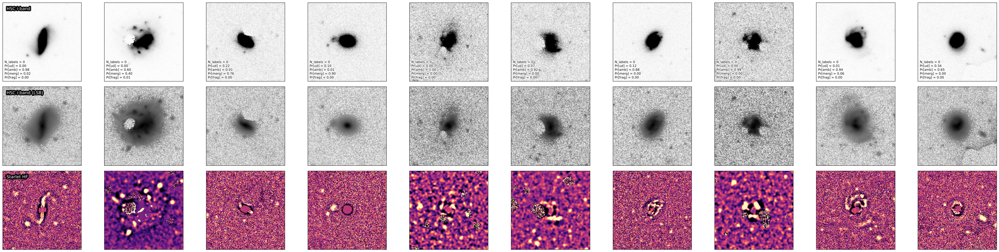

In [58]:
np.random.seed(43)
make_punchlines.make_figure_merger_candidates(data, None, logger, n_examples=10)

In [261]:
import numpy as np

2025-12-21 10:30:40,315 - make_punchlines - INFO - Generating Figure 6: Merger probability vs dSFS by mass
2025-12-21 10:30:40,315 - make_punchlines - INFO - Generating Figure 6: Merger probability vs dSFS by mass
2025-12-21 10:30:40,315 - make_punchlines - INFO - Generating Figure 6: Merger probability vs dSFS by mass
/Users/kadofong/work/ekfutils/ekfstats/ekfstats/sampling.py:573: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  xpull = x[choice]
/Users/kadofong/opt/miniconda3/envs/merian/lib/python3.10/site-packages/matplotlib/text.py:905: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x = float(self.convert_xunits(self._x))


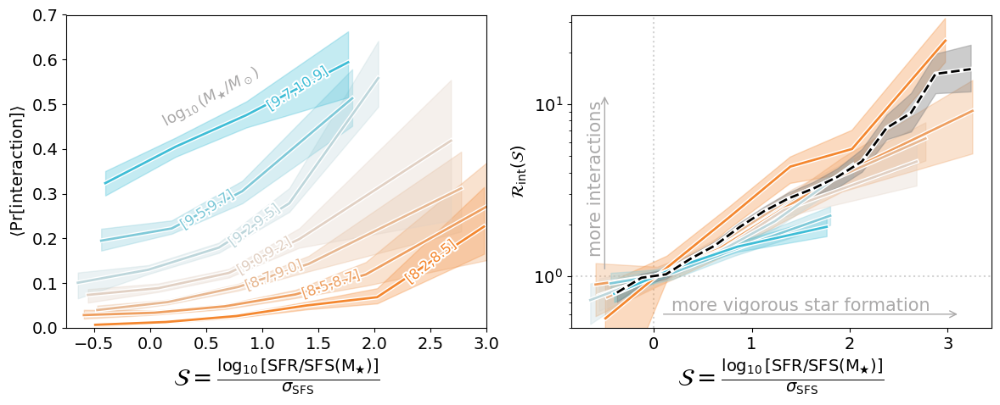

In [25]:
output_dir = make_punchlines.Path('/Users/kadofong/work/papers/journal/MerianStarbursts/figures/')

curve_data = make_punchlines.make_figure_merger_prob_vs_dsfs(data, None, logger)

2025-12-12 16:37:37,289 - make_punchlines - INFO - Generating Figure 6 (alternates): Merger probability vs dSFS
2025-12-12 16:37:37,296 - make_punchlines - INFO - Spec-z sample size: 2088
2025-12-12 16:37:37,332 - make_punchlines - INFO - Processing spec-z sample...
/Users/kadofong/work/ekfutils/ekfstats/ekfstats/sampling.py:573: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  xpull = x[choice]
/Users/kadofong/work/ekfutils/ekfstats/ekfstats/sampling.py:590: RuntimeWarning: Mean of empty slice
  outcome = metric_fn ( ypull[mask] )
/Users/kadofong/opt/miniconda3/envs/merian/lib/python3.10/site-packages/matplotlib/text.py:905: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing t

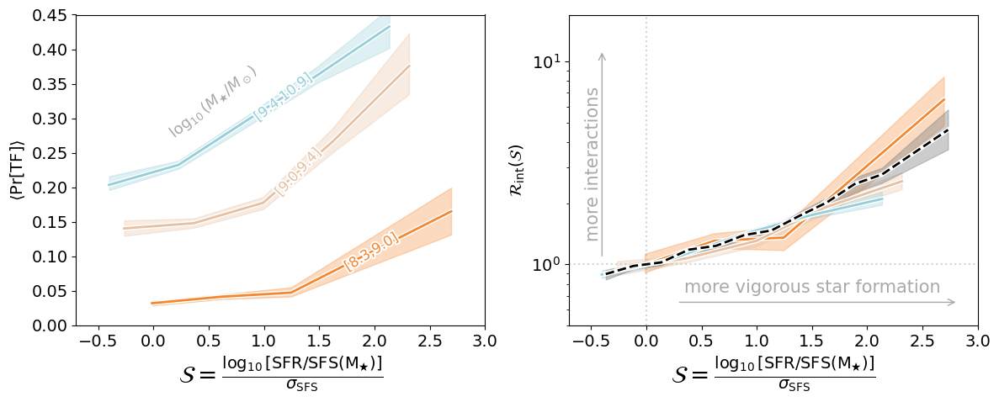

In [36]:
make_alternates.make_figure_merger_prob_vs_dsfs_alternates(data, None, logger)

In [1336]:
from pieridae.starbursts import sample

In [1344]:
sample_sizes = make_punchlines.get_sample_sizes(data, logger)

2025-12-01 13:35:31,558 - make_punchlines - INFO - Computing sample sizes at each selection stage
2025-12-01 13:35:31,558 - make_punchlines - INFO - Computing sample sizes at each selection stage
2025-12-01 13:35:31,574 - make_punchlines - INFO - Loaded Merian DR1 FITS catalog: 6482756 objects
2025-12-01 13:35:31,574 - make_punchlines - INFO - Loaded Merian DR1 FITS catalog: 6482756 objects
/Users/kadofong/opt/miniconda3/envs/merian/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/kadofong/opt/miniconda3/envs/merian/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/kadofong/work/projects/merian/carpenter/src/carpenter/emission.py:338: RuntimeWarning: divide by zero encountered in reciprocal
  emission_correction = correct_NIISII(redshift_values, ape

Computed aperture correction in 0.0 seconds.
Computed line contamination correction in 0.0 seconds.
Loading precomputed Galactic extinction map...
Interpolated Galactic extinction values from map.
Computed Galactic extinction correction in 0.6 seconds.
Computed internal extinction corrections in 0.6 seconds.


/Users/kadofong/work/projects/merian/agrias/python/agrias/photometry.py:115: RuntimeWarning: invalid value encountered in log10
  lsq_y = np.log10(np.array([ fdict[band] for band in plawbands ]))
/Users/kadofong/opt/miniconda3/envs/merian/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/kadofong/opt/miniconda3/envs/merian/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
2025-12-01 13:35:33,381 - make_punchlines - INFO - 
Sample sizes:
2025-12-01 13:35:33,381 - make_punchlines - INFO - 
Sample sizes:
2025-12-01 13:35:33,384 - make_punchlines - INFO -   Merian DR1 (full catalog): 6482756 (100.0%)
2025-12-01 13:35:33,384 - make_punchlines - INFO -   Merian DR1 (full catalog): 6482756 (100.0%)
2025-12-01 13:35:33,385 - make_punchlines - INFO -   Merian DR1 (

In [1345]:
sample_sizes

,stage,count,fraction
0,Merian DR1 (full catalog),6482756,1.000000
1,Merian DR1 (rough cut),196667,0.030337
2,Merian DR1 (good objects),54859,0.008462
3,Processed objects (with images),22360,0.003449
4,Final sample (after cuts),20437,0.003153


In [1171]:
from statsmodels.nonparametric.smoothers_lowess import lowess

In [1186]:
dsfs = make_punchlines.extract_dsfs(data, logger)
sfs_std = 0.22 * 0.08 + 0.38

2025-11-30 08:38:15,851 - make_punchlines - INFO - Computing distance from star-forming sequence (dSFS)
2025-11-30 08:38:15,851 - make_punchlines - INFO - Computing distance from star-forming sequence (dSFS)
2025-11-30 08:38:15,855 - make_punchlines - INFO - Computed dSFS for 20437 galaxies
2025-11-30 08:38:15,855 - make_punchlines - INFO - Computed dSFS for 20437 galaxies
2025-11-30 08:38:15,857 - make_punchlines - INFO - dSFS range: [-0.38, 2.00] dex
2025-11-30 08:38:15,857 - make_punchlines - INFO - dSFS range: [-0.38, 2.00] dex
2025-11-30 08:38:15,859 - make_punchlines - INFO - dSFS median: 0.16 dex
2025-11-30 08:38:15,859 - make_punchlines - INFO - dSFS median: 0.16 dex


In [1191]:
ptf = pd.DataFrame(
    data['prob_labels_iter'][:,2] + data['prob_labels_iter'][:,3],
    index=data['img_names'],
    columns=['ptf']
)
mask = abs(dsfs / sfs_std) < 0.2
out_baseline = sampling.running_metric(
    data['catalog'].loc[mask, 'logmass_adjusted'],
    ptf.reindex(data['catalog'].index).loc[mask],
    np.nanmean,
    np.linspace(7., 10.25, 12),
    erronmetric=True
)
pmerger_baseline_by_mass = lambda logmstar: np.interp(
    data['catalog']['logmass_adjusted'],
    out_baseline[0].flatten(),
    out_baseline[1][:, 0, 2].flatten()
)

/Users/kadofong/work/ekfutils/ekfstats/ekfstats/sampling.py:573: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  xpull = x[choice]
/Users/kadofong/work/ekfutils/ekfstats/ekfstats/sampling.py:590: RuntimeWarning: Mean of empty slice
  outcome = metric_fn ( ypull[mask] )
/Users/kadofong/opt/miniconda3/envs/merian/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [1305]:
from tqdm import tqdm

In [1222]:
mask = data['catalog'].reindex(data['img_names'])['logmass_adjusted']<8.
floor = np.mean(data['mean_prob_labels'][mask,2])

In [1329]:
data['catalog']['logmass_adjusted'].min()

7.510961279643515

In [1325]:
normalized_distance_above_ms = dsfs/sfs_std
excess_tf_probability = (ptf.reindex(dsfs.index)['ptf'].values-floor)/pmerger_baseline_by_mass(data['catalog']['logmass_adjusted'])

logmstar_mid = 8.5
dm = 0.2
mass_bins = np.linspace(8.5, 10., 10)
max_zeros = np.zeros_like(mass_bins)
for idx,logmstar_mid in enumerate(mass_bins):
    mass_mask = abs(data['catalog']['logmass_adjusted'] - logmstar_mid) < dm

    ls = lowess(excess_tf_probability[mass_mask]-floor, normalized_distance_above_ms.loc[mass_mask], )
    ls[:,1] /= np.interp(0., ls[:,0], ls[:,1])
    bootstrapped_ls = np.zeros([100, *ls.shape])
    bootstrapped_ls[0] = ls
    for _ in tqdm(range(1, len(bootstrapped_ls))):
        resample = np.random.randint(0 , mass_mask.sum(), mass_mask.sum())
        excess_prob_resample = (excess_tf_probability[mass_mask]-floor)[resample]
        dsfs_resample = (normalized_distance_above_ms.loc[mass_mask])[resample]
        ls = lowess(dsfs_resample, excess_prob_resample)
        ls[:,1] /= np.interp(0., ls[:,0], ls[:,1])    
        bootstrapped_ls[_] = ls
    
    
    xs = np.linspace(-0.5, 4., 500)
    bootstrapped_rectified = np.array([
        np.interp(xs, bootstrapped_ls[i,:,0], bootstrapped_ls[i,:,1])
        for i in range(bootstrapped_ls.shape[0])
    ])
    bootstrapped_gradient = np.gradient(bootstrapped_rectified, xs, axis=1)
    
    max_zero = xs[np.quantile(bootstrapped_gradient, 0.05, axis=0) < 0].max()
    max_zeros[idx] = max_zero

  0%|                                                                | 0/99 [00:00<?, ?it/s]/var/folders/fs/f3k7bp2n3k1bldhn58thddt40000gn/T/ipykernel_34345/2708688870.py:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  dsfs_resample = (normalized_distance_above_ms.loc[mass_mask])[resample]
100%|███████████████████████████████████████████████████████| 99/99 [00:01<00:00, 84.00it/s]


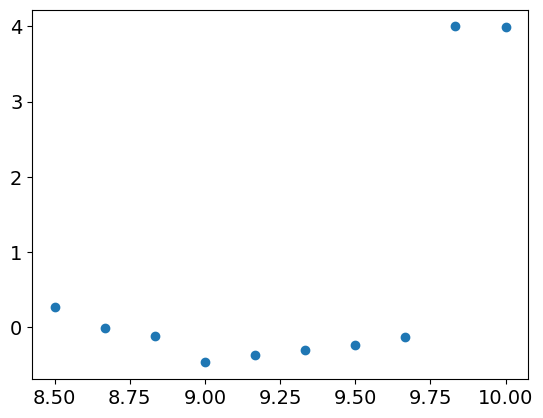

In [1326]:
plt.scatter(mass_bins, max_zeros)

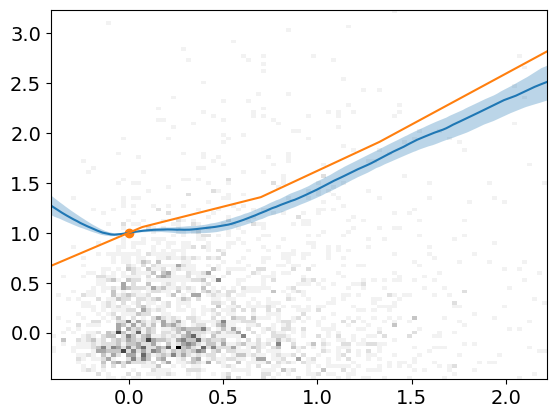

In [1309]:

ek.hist2d(
    normalized_distance_above_ms.loc[mass_mask], 
    excess_tf_probability[mass_mask],
    bins=100,
)
plt.plot(
    xs,
    np.quantile(bootstrapped_rectified, .5, axis=0)
)
plt.fill_between(
    xs,
    np.quantile(bootstrapped_rectified, .16, axis=0),
    np.quantile(bootstrapped_rectified, .84, axis=0),
    alpha=0.3,
)


curve_from_fig = curve_data['mass_bins'][list(curve_data['mass_bins'].keys())[3]]['normalized']
plt.plot(
    curve_from_fig[0],
    curve_from_fig[1]
)
plt.scatter(0.,1.)

In [1169]:
dc = curve_data['mass_bins'][mkeys[0]]['normalized']

In [1172]:
smoothed_fn = lowess(dc[1],dc[0],0.2)

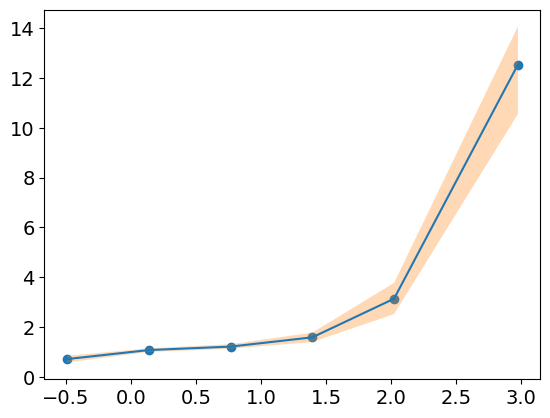

In [1175]:
plt.scatter(dc[0], dc[1])
plt.fill_between(
    dc[0], 
    dc[2],
    dc[3],
    alpha=0.3
)
plt.plot(smoothed_fn[:,0], smoothed_fn[:,1])
#plt.ylim(0.,2.)

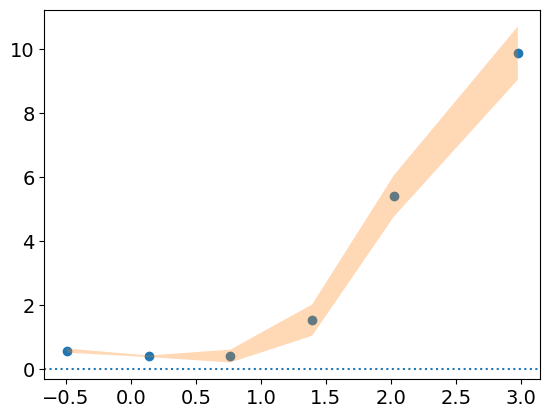

In [1167]:

# var(f(x)) = (df/dy)^2 var(y)^2
yval = np.gradient(dc[1], dc[0])
dydx = np.gradient(yval, dc[0])
u_dc = (dc[3]-dc[2])/2.
yval_var = (dydx  / yval)**2 * u_dc**2
plt.scatter(dc[0], yval)
plt.fill_between(
    dc[0], 
    yval-np.sqrt(yval_var),
    yval+np.sqrt(yval_var),
    alpha=0.3
)
plt.axhline(0., ls=':',)

2025-11-20 20:16:08,497 - make_punchlines - INFO - Generating Figure 7: H-alpha morphology distributions
2025-11-20 20:16:08,497 - make_punchlines - INFO - Generating Figure 7: H-alpha morphology distributions


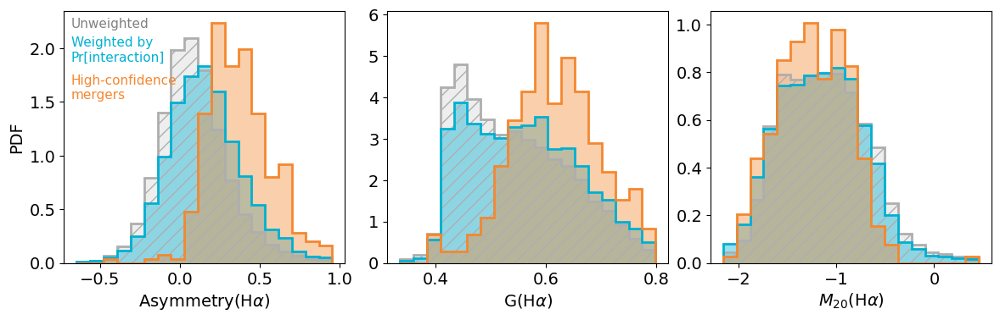

In [276]:
output_dir = None#make_punchlines.Path('/Users/kadofong/work/papers/journal/MerianStarbursts/figures/')
make_punchlines.make_figure_hamorph_distributions(data,output_dir,logger)

In [684]:
from scipy import stats

In [703]:
s = 100
sizes = np.logspace(1,3,10).astype(int)
dwass =  np.array([ np.quantile([stats.wasserstein_distance(np.random.normal(0.,1.,s), np.random.normal(0.,1.,s)) for _ in range(100)], [0.16,.5,.84]) 
          for s in sizes ])

/var/folders/fs/f3k7bp2n3k1bldhn58thddt40000gn/T/ipykernel_34345/2252311873.py:70: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axarr[1, colidx].set_yticklabels(axarr[1, colidx].get_yticklabels()[:-1])
/var/folders/fs/f3k7bp2n3k1bldhn58thddt40000gn/T/ipykernel_34345/2252311873.py:70: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axarr[1, colidx].set_yticklabels(axarr[1, colidx].get_yticklabels()[:-1])
/var/folders/fs/f3k7bp2n3k1bldhn58thddt40000gn/T/ipykernel_34345/2252311873.py:70: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axarr[1, colidx].set_yticklabels(axarr[1, colidx].get_yticklabels()[:-1])
/var/folders/fs/f3k7bp2n3k1bldhn58thddt40000gn/T/ipykernel_34345/2252311873.py:70: UserWarning: set_ticklabels() should only be used with a

Text(103.84722222222221, 0.5, 'F(x)')

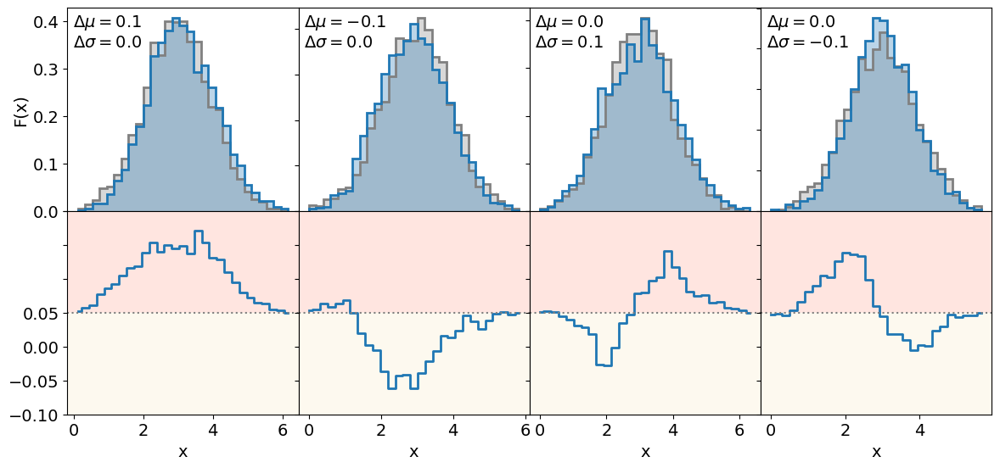

In [1107]:
n = 3000

base_mean = 3.
base_std = 1.

xs = [
    np.random.normal ( base_mean, base_std, n ),
    np.random.normal ( base_mean, base_std, n ),
    np.random.normal ( base_mean, base_std, n ),
    np.random.normal ( base_mean, base_std, n )
]

fig, axarr = plt.subplots(2,4,figsize=(12,5.5))

params = [(0.1,0.), (-0.1, 0.), (0., 0.1), (0., -0.1)]

ys = [
    np.random.normal(base_mean + p[0], base_std + p[1], n)
    for p in params
]


for colidx in range(len(ys)):
    x = xs[colidx]
    y = ys[colidx]
    eps = 1e-3
    bins = np.linspace(*np.quantile(np.concatenate([x,y]),[eps, 1.-eps]), 30)
    ax = axarr[0,colidx]
    ek.hist(x, density=True, alpha=0.3, lw=2, ax=ax, bins=bins, color='grey')
    ek.hist(y, density=True, alpha=0.3, lw=2, ax=ax, bins=bins)
    #ax = axarr[1,colidx]
    out = np.histogram(x, density=True, bins=bins, )
    unweighted_counts = np.cumsum(out[0])/np.sum(out[0])
    out = np.histogram(y, density=True,  bins=bins, )
    weighted_counts = np.cumsum(out[0])/np.sum(out[0])

    ax = axarr[1, colidx]
    ax.step(
        sampling.midpts(bins),
        unweighted_counts - weighted_counts,
        where='mid',
        lw=2, 
    )
    ax.set_ylim(-0.06,0.06)
    ax.axhline(0., ls=':', color='grey')
    
    weighted_towards_lesser = stats.ks_2samp(*sampling.fmasker(x, y),alternative='lesser')
    weighted_towards_greater = stats.ks_2samp(*sampling.fmasker(x, y),alternative='greater')
    weighted_is_different = stats.ks_2samp(*sampling.fmasker(x, y),alternative='two-sided')
    if False:
        fn = lambda x: np.around(x.pvalue,3)
        ek.text(
            0.025,
            colidx in [1,2] and 0.975 or 0.0275,
            rf'''$p_{{\rm val}}$(lower) = {fn(weighted_towards_lesser):.2f}
$p_{{\rm val}}$(higher) = {fn(weighted_towards_greater):.2f}
$p_{{\rm val}}$(identical) = {fn(weighted_is_different):.2f}''',
            ax=ax,
            fontsize=12
        )
    dm, ds = params[colidx]
    ek.text (
        0.025,
        0.975,
        rf'''$\Delta \mu = {{{dm:.1f}}}$
$\Delta \sigma = {{{ds:.1f}}}$''',
        ax=axarr[0,colidx]
    )
    axarr[0, colidx].set_xticklabels([])
    axarr[1, colidx].set_yticklabels(axarr[1, colidx].get_yticklabels()[:-1])

for ax in axarr[:,1:].flatten():
    ax.set_yticklabels([])
plt.tight_layout ()
plt.subplots_adjust(hspace=0.0, wspace=0.)

for ax in axarr[1]:
    ax.autoscale(enable=False, axis='y')

    # Red background for positive values (shifted higher)
    ax.axhspan(
        0.,
        ax.get_ylim()[1],
        color=ec.ColorBase(colorlists.slides['red']).modulate(0.5).base,
        zorder=-1
    )
    # Yellow background for negative values (shifted lower)
    ax.axhspan(
        ax.get_ylim()[0],
        0.,
        color=ec.ColorBase(colorlists.slides['yellow']).modulate(0.3).base,
        zorder=-1
    )
    ax.set_xlabel('x')
axarr[0,0].set_ylabel('F(x)')


In [1126]:
make_punchlines.mk_appendix_metric(output_dir, logger, n_samples=5000)

2025-11-27 15:53:21,386 - make_punchlines - INFO - Generating Appendix Figure: Differential CDF metric demonstration
2025-11-27 15:53:21,386 - make_punchlines - INFO - Generating Appendix Figure: Differential CDF metric demonstration
2025-11-27 15:53:21,981 - make_punchlines - INFO - Saved: /Users/kadofong/work/papers/journal/MerianStarbursts/figures/fig_appendix_differential_metric.pdf
2025-11-27 15:53:21,981 - make_punchlines - INFO - Saved: /Users/kadofong/work/papers/journal/MerianStarbursts/figures/fig_appendix_differential_metric.pdf


In [43]:
output_dir = make_punchlines.Path('/Users/kadofong/work/papers/journal/MerianStarbursts/figures/')
pvals_df = make_alternates.make_hamorph_differential_split(data, output_dir, logger)


2025-12-14 10:45:16,658 - make_punchlines - INFO - Generating Figure: H-alpha and Continuum morphology differential (split)
2025-12-14 10:45:16,794 - make_punchlines - INFO -   Generating continuum figure...
2025-12-14 10:45:17,441 - make_punchlines - INFO - Saved: /Users/kadofong/work/papers/journal/MerianStarbursts/figures/fig_hamorph_differential_continuum.pdf
2025-12-14 10:45:17,442 - make_punchlines - INFO -   Generating halpha figure...
2025-12-14 10:45:17,989 - make_punchlines - INFO - Saved: /Users/kadofong/work/papers/journal/MerianStarbursts/figures/fig_hamorph_differential_halpha.pdf
2025-12-14 10:45:18,000 - make_punchlines - INFO - Computed KS test p-values for 40 combinations


2025-11-27 15:58:09,320 - make_punchlines - INFO - Generating Figure: H-alpha and Continuum morphology differential (split)
2025-11-27 15:58:09,320 - make_punchlines - INFO - Generating Figure: H-alpha and Continuum morphology differential (split)
2025-11-27 15:58:09,327 - make_punchlines - INFO -   Generating continuum figure...
2025-11-27 15:58:09,327 - make_punchlines - INFO -   Generating continuum figure...


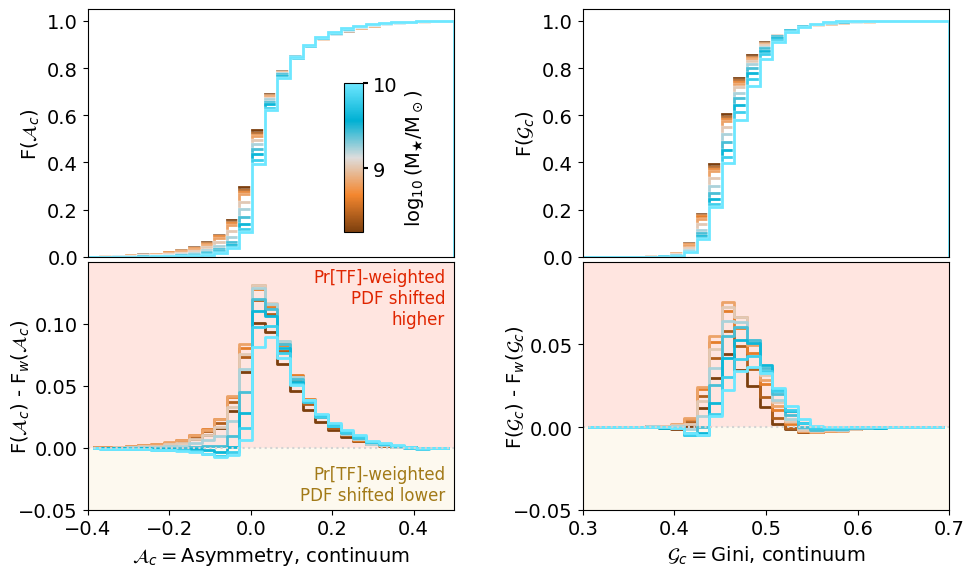

2025-11-27 15:58:10,586 - make_punchlines - INFO -   Generating halpha figure...
2025-11-27 15:58:10,586 - make_punchlines - INFO -   Generating halpha figure...


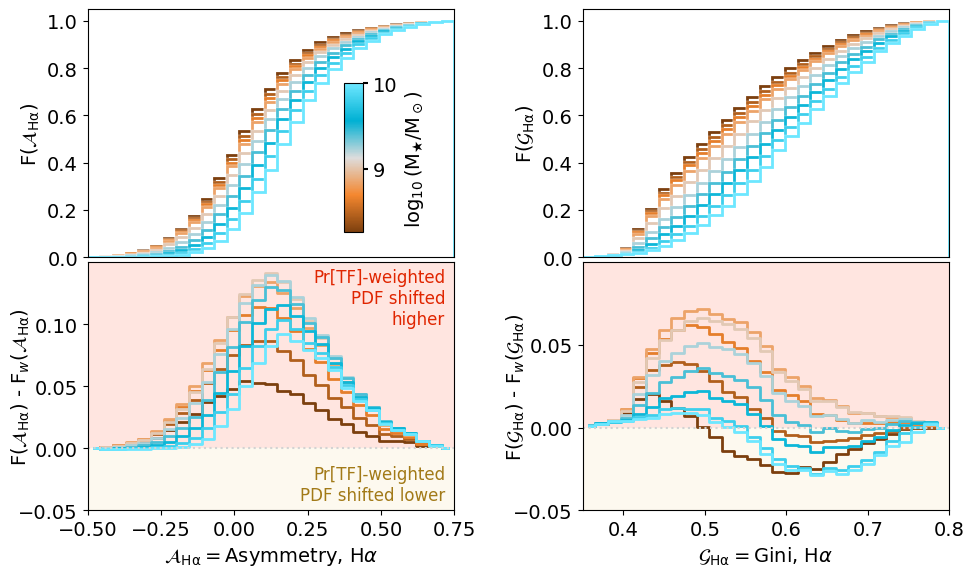

2025-11-27 15:58:11,779 - make_punchlines - INFO - Computed KS test p-values for 40 combinations
2025-11-27 15:58:11,779 - make_punchlines - INFO - Computed KS test p-values for 40 combinations


In [1127]:
output_dir = None# make_punchlines.Path('/Users/kadofong/work/papers/journal/MerianStarbursts/figures/')
pvals_df = make_punchlines.make_hamorph_differential_split(data, output_dir, logger)


In [1106]:
pvals_df.loc[('halpha','gini')]

,p_lesser,p_greater,p_twosided,description
mass_bin,,,,
8.250000,0.00,0.00,0.00,Statistically distinct from ref w/o monotonic ...
8.444444,0.17,0.00,0.00,Consistent with f_w shifted higher
8.638889,0.99,0.00,0.00,Consistent with f_w shifted higher
8.833333,1.00,0.00,0.00,Consistent with f_w shifted higher
9.027778,1.00,0.00,0.00,Consistent with f_w shifted higher
9.222222,1.00,0.00,0.00,Consistent with f_w shifted higher
9.416667,0.57,0.00,0.00,Consistent with f_w shifted higher
9.611111,0.13,0.00,0.00,Consistent with f_w shifted higher
9.805556,0.00,0.86,0.00,Consistent with f_w shifted lower


continuum_asymmetry
8.2: mean = 0.04, 0.06; std = 0.12, 0.12
halpha_asymmetry
8.2: mean = -0.37, -0.44; std = 6.55, 7.28
continuum_gini
8.2: mean = 0.46, 0.47; std = 0.03, 0.03
halpha_gini
8.2: mean = 0.09, -0.05; std = 6.58, 7.54


<Axes: xlabel='$\\mathcal{A}$$_{c}$$=$Asymmetry, continuum', ylabel='F($\\mathcal{A}$$_{c}$) - F$_w$($\\mathcal{A}$$_{c}$)'>

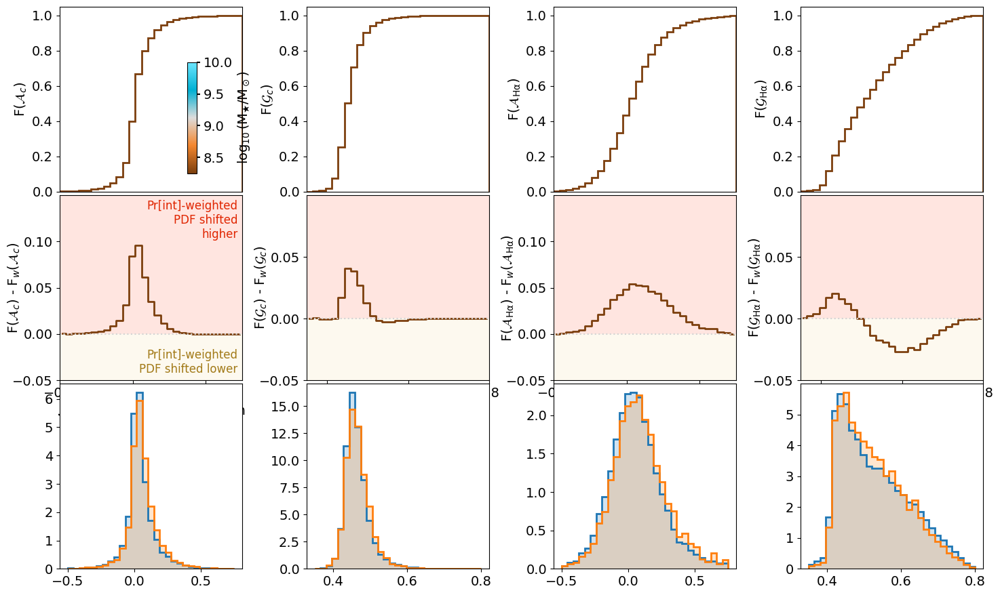

In [1030]:
fig, axarr = plt.subplots(3,4,figsize=(15,9))

morphstats = ['asymmetry','gini']#,'m20']
morphlabels = [r'$\mathcal{A}$',r'$\mathcal{G}$']
morph_names = ['asymmetry','Gini']
tracers = ['continuum','halpha']
tracer_sub = ['c',r'\rm H\alpha']
tracer_names = ['continuum',r'H$\alpha$']

xbins = np.linspace(8.25, 10., 10)
pvals = np.zeros([len(xbins), 2,2,3])
cmap = make_punchlines.cmap
ybins_l = [ np.linspace(-0.5,0.75, 30), np.linspace(0.35, 0.8,30) ]
ylims = [(-0.05,.15), (-0.04, 0.1)]

for mdx, ms in enumerate(morphstats):
    for tdx, tracer in enumerate(tracers):
        color = colorlists.slides[tracer == 'halpha' and 'red' or 'bluebird']
    
        idx = mdx*len(morphstats) + tdx
        key = f'{tracer}_{ms}'
        ax=axarr[0, mdx % 2 + tdx*2]
        bx=axarr[1, mdx % 2 + tdx*2]
        
        #eps = 0.005
        #vals = np.quantile(
        #    sampling.sigmaclip(sampling.fmasker(data['hamorph'].reindex(data['catalog'].index)[key].values)).clipped,
        #    [eps,1-eps]
        #)
        ybins = ybins_l[mdx] #np.linspace(*vals, 20)
        ax.set_xlim(ybins[0], ybins[-1])
        bx.set_xlim(ybins[0],ybins[-1])
        
        dx = 1.
        print(key)
        print('='*len(key))
        for mass_idx,mass_mid in enumerate(xbins):
            mass_mask = abs(data['catalog']['logmass_adjusted'].values - mass_mid) < dx

            cc = cmap((mass_mid - xbins.min())/(xbins.max()-xbins.min()))
            out = ek.hist(
                data['hamorph'].reindex(data['catalog'].index)[key].values[mass_mask],
                cumulative=True,
                density=True,
                histtype='step',
                ax=ax,
                color=cc,
                bins=ybins,
                lw=2
            )
            unweighted_counts = out[1][0]

            fn = lambda x: np.random.choice(x, replace=True, size=x.size)
            out = np.histogram(
                #fn(data['hamorph'].reindex(data['catalog'].index)[key].values[mass_mask]),
                data['hamorph'].reindex(data['catalog'].index)[key].values[mass_mask],
                weights=cdf['pmerger'].values[mass_mask],
                bins=ybins,
                #cumulative=True,
                density=True,
            )
         
            weighted_counts = np.cumsum(out[0])/np.sum(out[0])
            bx.step(
                sampling.midpts(ybins), 
                unweighted_counts - weighted_counts, 
                where='mid',
                color=cc,
                lw=2
            )
            bx.axhline(0., ls=':', color='lightgrey')
            if False:
                ek.hist(
                    data['hamorph'].reindex(data['catalog'].index)[key].values[mass_mask],
                    weights=cdf['pmerger'].values[mass_mask],
                    cumulative=True,
                    density=True,
                    histtype='step',
                    ax=ax,
                    color=cc,
                    ls='--'
                )  

            morph_samp = data['hamorph'].reindex(data['catalog'].index)[key].values[mass_mask]
            ps = np.where(np.isfinite(morph_samp), cdf['pmerger'].values[mass_mask], 0.)
            
            wmorph_samp = np.random.choice(
                morph_samp, 
                p=ps/np.sum(ps),
                replace=True,
                size=morph_samp.size
            )
            
            # lesser: weighted sample skews higher
            # greater : weighted sample skews lower
            weighted_towards_lesser = stats.ks_2samp(*sampling.fmasker(morph_samp, wmorph_samp),alternative='lesser')
            weighted_towards_greater = stats.ks_2samp(*sampling.fmasker(morph_samp, wmorph_samp),alternative='greater')
            weighted_is_same = stats.ks_2samp(*sampling.fmasker(morph_samp, wmorph_samp),alternative='two-sided') 
            
            pvals[mass_idx,tdx,mdx] = (weighted_towards_lesser.pvalue,weighted_towards_greater.pvalue,weighted_is_same.pvalue)
            print(f'{mass_mid:.1f}: mean = {np.nanmean(morph_samp):.2f}, {np.nanmean(wmorph_samp):.2f}; std = {np.nanstd(morph_samp):.2f}, {np.nanstd(wmorph_samp):.2f}')

            cx=axarr[2, mdx % 2 + tdx*2]
            ek.hist(morph_samp, ax=cx, alpha=0.2, lw=2, density=True, bins=ybins)
            ek.hist(wmorph_samp, ax=cx, alpha=0.2, lw=2, density=True, bins=ybins)  
            #ek.hist(morph_samp, weights=ps, ax=cx, alpha=0.2, lw=2, density=True, bins=ybins)  
            break

        if (mdx==0) and (tdx==0):
            ek.colorbar_inset(
                cmap,
                xbins[0],
                xbins[-1],
                x=0.7,
                y=0.1,
                height=0.6,
                width=0.05,
                label=ek.common_labels['logmstar'],
                orientation='vertical',
                ax=ax
            )
            
        mlbl = rf'{morphlabels[mdx]}$_{{{tracer_sub[tdx]}}}$'
        #ax.set_xlabel(mlbl)
        bx.set_xlabel(rf'{mlbl}$=${morph_names[mdx].capitalize()}, {tracer_names[tdx]}')
        ax.set_ylabel(rf'F({mlbl})')
        bx.set_ylabel(rf'F({mlbl}) - F$_w$({mlbl})', labelpad=-10)
        ax.set_xticks([])
        bx.set_ylim(ylims[mdx])
        bx.set_yticks(bx.get_yticks()[:-1])
        #ax.set_yticks(ax.get_yticks()[1:])


plt.tight_layout ()
plt.subplots_adjust(wspace=0.35, hspace=0.02)


for ax in axarr[1]:
    ax.autoscale(enable=False, axis='y')
    
    ax.axhspan(
        0., 
        ax.get_ylim()[1], 
        color=ec.ColorBase(colorlists.slides['red']).modulate(0.5).base,
        zorder=-1
    )
    ax.axhspan( 
        ax.get_ylim()[0], 
        0.,
        color=ec.ColorBase(colorlists.slides['yellow']).modulate(0.3).base,
        zorder=-1
    )

ax = axarr[1,0]
ek.text(
    0.975,
    0.025,
    '''Pr[int]-weighted
PDF shifted lower''',
    color=ec.ColorBase(colorlists.slides['yellow']).modulate(-0.3).base,
    ax=axarr[1,0],
    fontsize=12
)
ek.text(
    0.975,
    0.975,
    '''Pr[int]-weighted
PDF shifted
higher''',
    color=colorlists.slides['red'],
    ax=axarr[1,0],
    fontsize=12,
    #coord_type=('relative','absolute')
)

#plt.savefig('/Users/kadofong/work/papers/journal/MerianStarbursts/figures/fig_hamorph_differential.pdf')

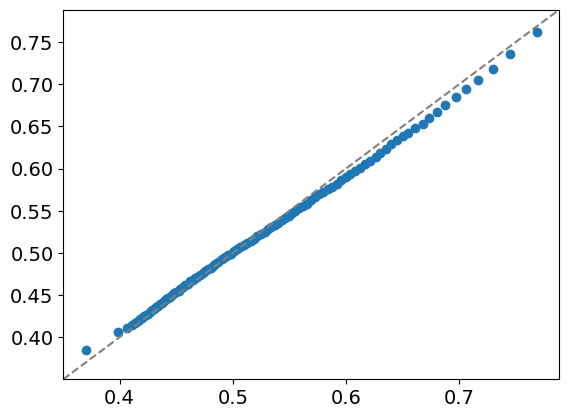

In [1078]:
eps = 5e-3
qs = np.linspace(eps, 1.-eps, 100)
fn = lambda x: np.where(abs(x)<50., x, np.nan)
plt.scatter(
    np.nanquantile(fn(morph_samp), qs),
    np.nanquantile(fn(wmorph_samp), qs)
)
ek.oneone()

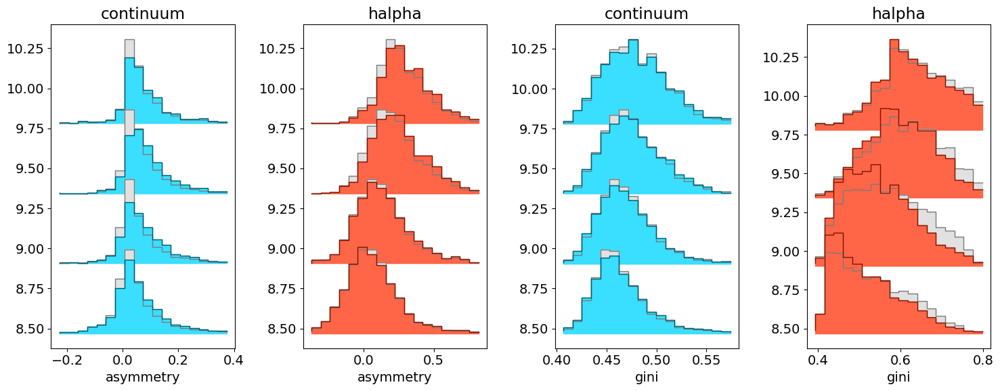

In [716]:
fig, axarr = plt.subplots(1,4,figsize=(15,6))

#keys = ['continuum_asymmetry','halpha_asymmetry','halpha_gini']
morphstats = ['asymmetry','gini']#,'m20']
tracers = ['continuum','halpha']

for tdx, tracer in enumerate(tracers):
    color = colorlists.slides[tracer == 'halpha' and 'red' or 'bluebird']
    for mdx, ms in enumerate(morphstats):
        #for key in keys:
        idx = tdx*len(morphstats) + mdx
        key = f'{tracer}_{ms}'
        ax=axarr[tdx % 2 + mdx*2]
        
        eps = 0.005
        vals = np.quantile(
            sampling.sigmaclip(sampling.fmasker(data['hamorph'].reindex(data['catalog'].index)[key].values)).clipped,
            [eps,1-eps]
        )
        ybins = np.linspace(*vals, 20)
        #xbins = logmstar_bins = np.array([8.25, 9., 9.5, 10.]) #
        xbins = np.linspace(8.25, 10., 5)
        #_,xbins = sampling.bin_by_count(
        #    data['catalog']['logmass_adjusted'],
        #    500,
        #    0.5
        #)
        
        (_,_,spacing), _ = ek.histstack_x(
            data['hamorph'].reindex(data['catalog'].index)[key].values,
            data['catalog']['logmass_adjusted'].values,    
            ybins=xbins,
            xbins=ybins,
            show_quantile=False,
            color=colorlists.slides['grey'],
            linewidth=1,
            color_by_count=False,
            ax=ax
        )
        
        _ = ek.histstack_x(
            data['hamorph'].reindex(data['catalog'].index)[key].values,
            data['catalog']['logmass_adjusted'].values,   
            w=cdf['pmerger'].values,
            ybins=xbins,
            xbins=ybins,
            show_quantile=False,
            color=color,
            linewidth=1,
            color_by_count=False,
            spacing=spacing,
            ax=ax
        )
        ax.set_xlabel(ms)
        ax.set_title(tracer)
plt.tight_layout ()
#abby = np.array(
#    [[9.137540813297715, 0.22038438705847432],
#    [9.573228950232512, 0.2491763134461264],
#    [9.932930147422578, 0.267371623627189],
#    [10.1906970416543, 0.27620213713268027]]
#)
#plt.scatter(
#    abby[:,1],
#    abby[:,0],
#    color='r'
#)

((array([ 8.25      ,  8.54166667,  8.83333333,  9.125     ,  9.41666667,
          9.70833333, 10.        ]),
  array([-0.17253609, -0.1473783 , -0.1222205 , -0.09706271, -0.07190492,
         -0.04674713, -0.02158933,  0.00356846,  0.02872625,  0.05388405,
          0.07904184,  0.10419963,  0.12935742,  0.15451522,  0.17967301,
          0.2048308 ,  0.2299886 ,  0.25514639,  0.28030418,  0.30546197]),
  array([0., 0., 0., 0., 0., 0.])),
 <Axes: >)

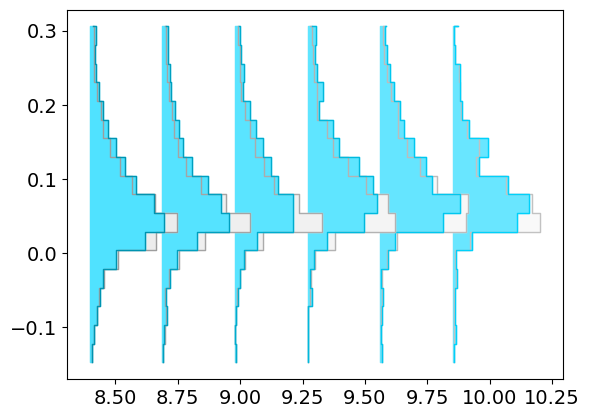

In [443]:
key = 'continuum_asymmetry'

(_,_,spacing), _=ek.histstack(
    data['catalog']['logmass_adjusted'].values,
    data['hamorph'].reindex(data['catalog'].index)[key].values,
    ybins=ybins,
    xbins=xbins,
    show_quantile=False,
    color=colorlists.slides['grey'],
    linewidth=1,
)

ek.histstack(
    data['catalog']['logmass_adjusted'].values,
    data['hamorph'].reindex(data['catalog'].index)[key].values,
    w=cdf['pmerger'].values,
    ybins=ybins,
    xbins=xbins,
    spacing=spacing,
    show_quantile=False,
    color=colorlists.slides['bluebird'],
    linewidth=1,
)

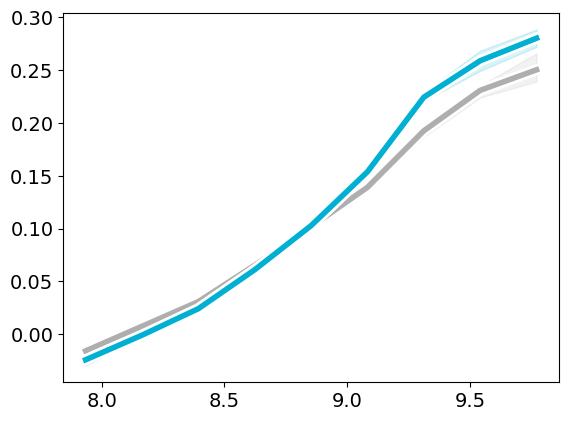

In [341]:
_=ek.running_quantile(
    data['catalog']['logmass_adjusted'].values,
    data['hamorph'].reindex(data['catalog'].index)['halpha_asymmetry'].values,
    bins=10,
    erronqt=True,
    show_std=False,
    err_format='fill_between',
    color=colorlists.slides['grey']
)

_=ek.running_quantile(
    data['catalog']['logmass_adjusted'].values,
    data['hamorph'].reindex(data['catalog'].index)['halpha_asymmetry'].values,
    weights=cdf['pmerger'].values,
    bins=10,
    erronqt=True,
    show_std=False,
    err_format='fill_between',
    color=colorlists.slides['bluebird']
)

In [292]:
df.shape, data['catalog'].shape

((22360, 1), (20437, 80))

2025-11-20 20:27:21,211 - make_punchlines - INFO - Generating Figure 7b: H-alpha morphology distributions by mass
2025-11-20 20:27:21,211 - make_punchlines - INFO - Generating Figure 7b: H-alpha morphology distributions by mass
2025-11-20 20:27:21,277 - make_punchlines - INFO -   Mass bin [8.0, 9.25): 14529 galaxies
2025-11-20 20:27:21,277 - make_punchlines - INFO -   Mass bin [8.0, 9.25): 14529 galaxies
2025-11-20 20:27:21,387 - make_punchlines - INFO -   Mass bin [9.25, 10.0): 2562 galaxies
2025-11-20 20:27:21,387 - make_punchlines - INFO -   Mass bin [9.25, 10.0): 2562 galaxies
2025-11-20 20:27:21,466 - make_punchlines - INFO -   Mass bin [10.0, 10.5): 305 galaxies
2025-11-20 20:27:21,466 - make_punchlines - INFO -   Mass bin [10.0, 10.5): 305 galaxies


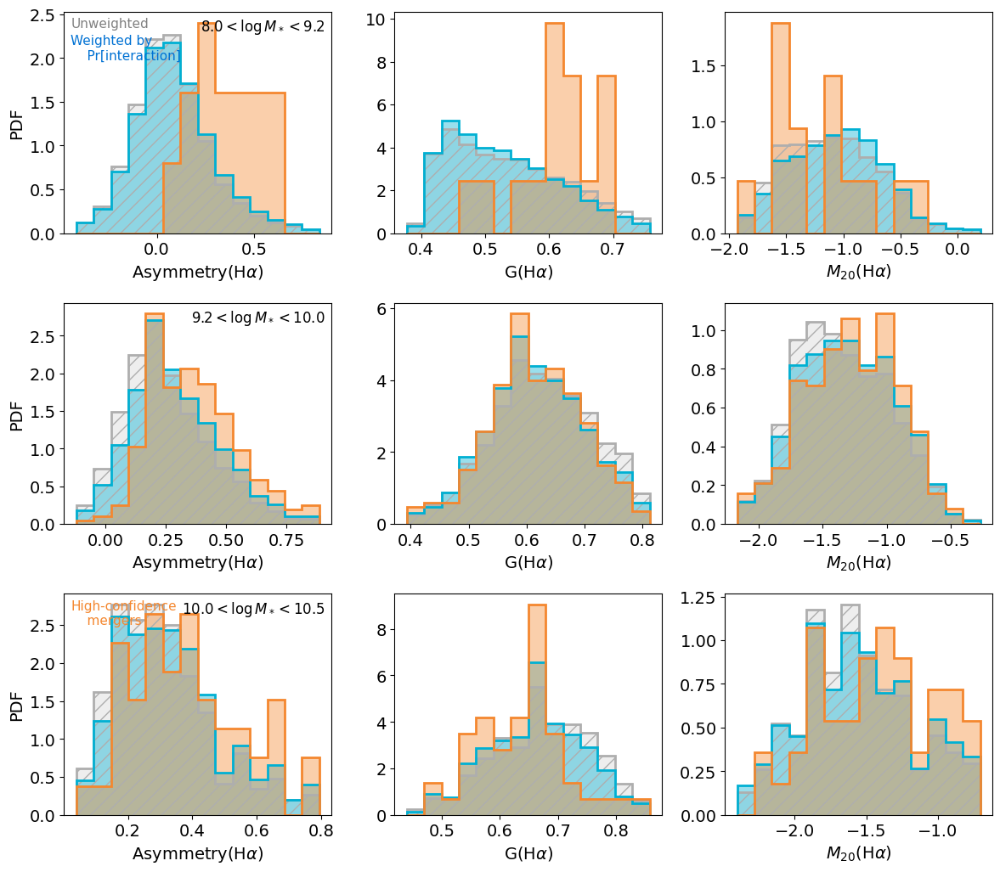

In [281]:
make_punchlines.make_figure_hamorph_distributions_by_mass(data,None,logger)

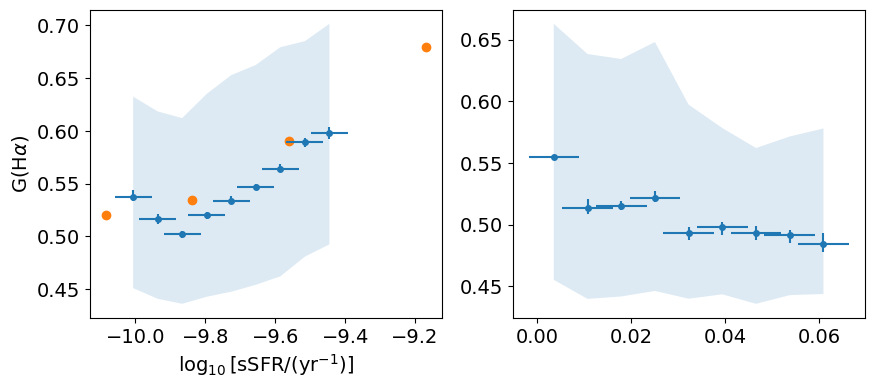

In [94]:
import numpy as np
from ekfphys import calibrations

fig, axarr = plt.subplots(1,2,figsize=(10,4))
dh = data['hamorph']
dc = data['catalog'].reindex(dh.index)
massmask = (dc['logmass_adjusted']>8.3)&(dc['logmass_adjusted']<9.)
dh = dh.loc[massmask]
dc = dc.loc[massmask]
ek.running_quantile(
    np.log10(calibrations.LHa2SFR(dc['L_Ha'])) - dc['logmass_adjusted'],    
    dh['halpha_gini'],
    bins=10,
    erronqt=True,
    ax=axarr[0]
)

abbyvals = np.array([[8.233353836069257e-11, 0.5205557370433713],
[1.4551270105806394e-10, 0.5345433232767731],
[2.7553306097527186e-10, 0.5900055727435192],
[6.779651417773836e-10, 0.6791733123234496]])
axarr[0].scatter(np.log10(abbyvals[:,0]), abbyvals[:,1])
axarr[0].set_xlabel(r"$\log_{10}$[sSFR/(yr$^{-1}$)]")
axarr[0].set_ylabel(r'G(H$\alpha)$')

_=ek.running_quantile(
    dc['p_merger']+dc['p_ambig'],
    dh['halpha_gini'],
    bins=10,
    erronqt=True,
    ax=axarr[1]
)


In [95]:
import numpy as np
from ekfstats import sampling

In [12]:
xbins = np.linspace(0.,1.,10)
hcounts = sampling.bootstrap_histcounts(np.random.uniform(0.,1.,10000), xbins)

In [13]:
cc = np.cumsum(hcounts,axis=1)/np.sum(hcounts,axis=1).reshape(-1,1)

2025-11-04 15:07:04,515 - make_punchlines - INFO - Generating Figure 9: Merger probability vs environment
/Users/kadofong/work/ekfutils/ekfstats/ekfstats/sampling.py:584: RuntimeWarning: Mean of empty slice
  outcome = metric_fn ( ypull[mask] )
/Users/kadofong/opt/miniconda3/envs/merian/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/Users/kadofong/work/ekfutils/ekfstats/ekfstats/sampling.py:584: RuntimeWarning: Mean of empty slice
  outcome = metric_fn ( ypull[mask] )


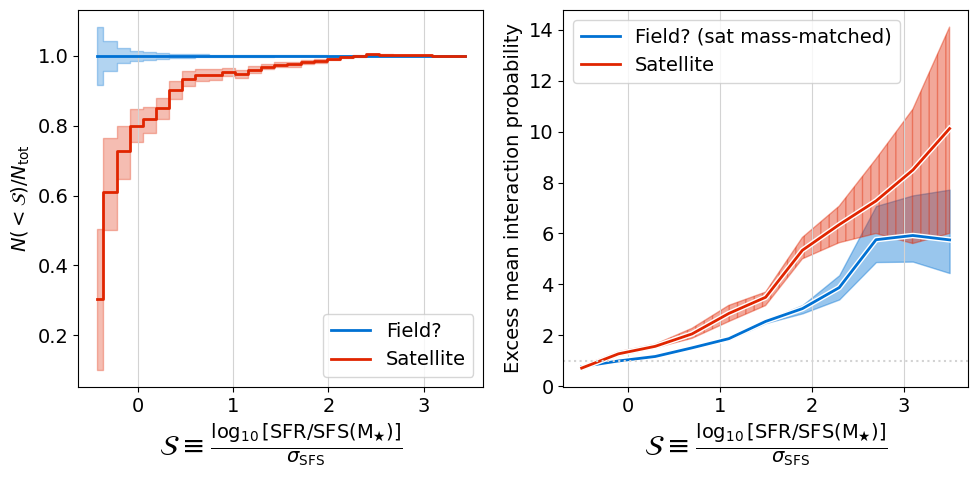

In [14]:
make_punchlines.make_figure_merger_prob_vs_environment(data, output_dir, logger)

2025-11-04 15:07:09,273 - make_punchlines - INFO - Generating Figure 9 (alternates): Merger probability vs environment
2025-11-04 15:07:09,276 - make_punchlines - INFO - Spec-z sample size: 9899
/Users/kadofong/opt/miniconda3/envs/merian/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/Users/kadofong/work/ekfutils/ekfstats/ekfstats/sampling.py:584: RuntimeWarning: Mean of empty slice
  outcome = metric_fn ( ypull[mask] )


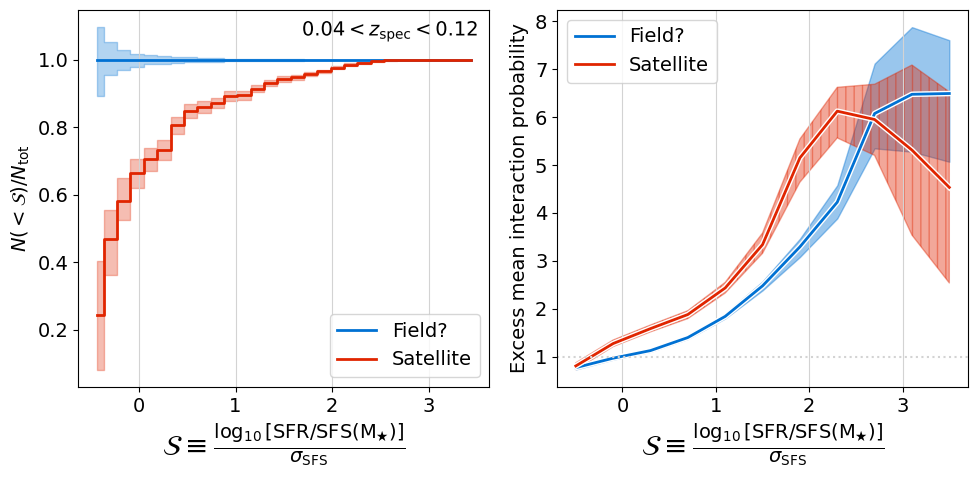

In [15]:
make_alternates.make_figure_merger_prob_vs_environment_alternates(data, output_dir, logger)

In [16]:
from ekfphys import calibrations

In [17]:
catalog = data['catalog']
is_satellite = data['is_satellite']

In [18]:
base = catalog.loc[~is_satellite, 'logmass_adjusted']
target = catalog.loc[is_satellite, 'logmass_adjusted']


In [19]:
resampled = sampling.make_matched_sample(base, target, return_indices=False, )